In [1]:
from IPython.display import HTML

import cosima_cookbook as cc
from dask.distributed import Client

import numpy as np
import pandas as pd
import xarray as xr

from oceanpy.plot import play2d

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import string

In [2]:
def display_animation(anim):
    plt.close(anim._fig)
    return HTML(anim.to_html5_video())

In [3]:
fs_small = 20
fs_large = 22

plt.rc('xtick',labelsize=fs_small)
plt.rc('ytick',labelsize=fs_small)
plt.rc('axes', labelsize=fs_large)
plt.rcParams.update({"text.usetex": True, "font.family": 'serif', "font.serif": 'cm', 'font.size': fs_small})
plt.rc('text.latex', preamble=r'\usepackage{xfrac}\usepackage{amsmath}\usepackage{amsfonts}\usepackage{amssymb}')


## Load data

In [4]:
client = Client(threads_per_worker=1, memory_limit=0)
client.amm.start()

In [5]:
database = '/g/data/ik11/databases/cosima_master.db'
session = cc.database.create_session(db=database)

In [6]:
expt = '01deg_jra55v140_iaf'

In [7]:
# start and end time of dataset
start = '1997-01-01'
end = '1999-12-31'

# data output frequency
freq = '1 daily'

# location limits of dataset
lon_lim = slice(-224, -212.5)
lat_lim = slice(-53.5, -47.5)

In [8]:
sl = cc.querying.getvar(expt=expt, variable='sea_level', session=session, frequency=freq, start_time=start, end_time=end)
u = cc.querying.getvar(expt=expt, variable='u', session=session, frequency=freq, start_time=start, end_time=end)
v = cc.querying.getvar(expt=expt, variable='v', session=session, frequency=freq, start_time=start, end_time=end)
wt = cc.querying.getvar(expt=expt, variable='wt', session=session, frequency=freq, start_time=start, end_time=end)
ht = cc.querying.getvar(expt=expt, variable='ht', session=session, frequency='static', n=1)

In [9]:
# select data in area of interest and time period
sl_lim = sl.sel(xt_ocean=lon_lim, yt_ocean=lat_lim)
u_lim = u.sel(xu_ocean=lon_lim, yu_ocean=lat_lim)
v_lim = v.sel(xu_ocean=lon_lim, yu_ocean=lat_lim)
wt_lim = wt.sel(xt_ocean=lon_lim, yt_ocean=lat_lim)
ht_lim = ht.sel(xt_ocean=lon_lim, yt_ocean=lat_lim)

In [10]:
ds_vel = xr.merge([sl_lim, u_lim, v_lim, wt_lim, ht_lim])
vel = ds_vel.assign_coords(
    xt_ocean=((ds_vel.xt_ocean + 180) % 360) - 180,
    xu_ocean=((ds_vel.xu_ocean + 180) % 360) - 180,)

## Select meander period

In [16]:
meander = 2

time_lim = {1: {'meander_period': slice('1997-02-15', '1997-05-31'), 
                'flex_period': slice('1997-04-10', '1997-04-25')},
            2: {'meander_period': slice('1996-10-25', '1997-01-08'), 
                'flex_period': slice('1996-11-29', '1996-12-09')},
            3: {'meander_period': slice('1998-05-30', '1998-08-14'), 
                'flex_period': slice('1998-06-24', '1998-07-03')},
            4: {'meander_period': slice('1999-04-15', '1999-07-15'), 
                'flex_period': slice('1999-06-05', '1999-06-15')}
           }

In [17]:
days=5
vel_resample = vel.sel(time=time_lim[meander]['meander_period']).resample(time='%sD'%days).mean()
vel_resample

d_int = 2500 # m
V_threshold = 0.07 # m/s
vel_flex = vel.sel(time=time_lim[meander]['flex_period'])
vel_flex['V'] = np.sqrt(vel_flex.u**2 + vel_flex.v**2)

In [18]:
core_contour = -0.4
sl_contours = [core_contour-0.2, core_contour, core_contour+0.2]
wt_contours = [-1.25e-4, -.75e-4, -.25e-4, .25e-4, .75e-4, 1.25e-4]
# wt_contours = [-5e-4, -3e-4, -1e-4,  1e-4,  3e-4, 5e-4]


16 4 4


Text(0, 0.5, 'Vertical velocity, $w$ (m/s)')

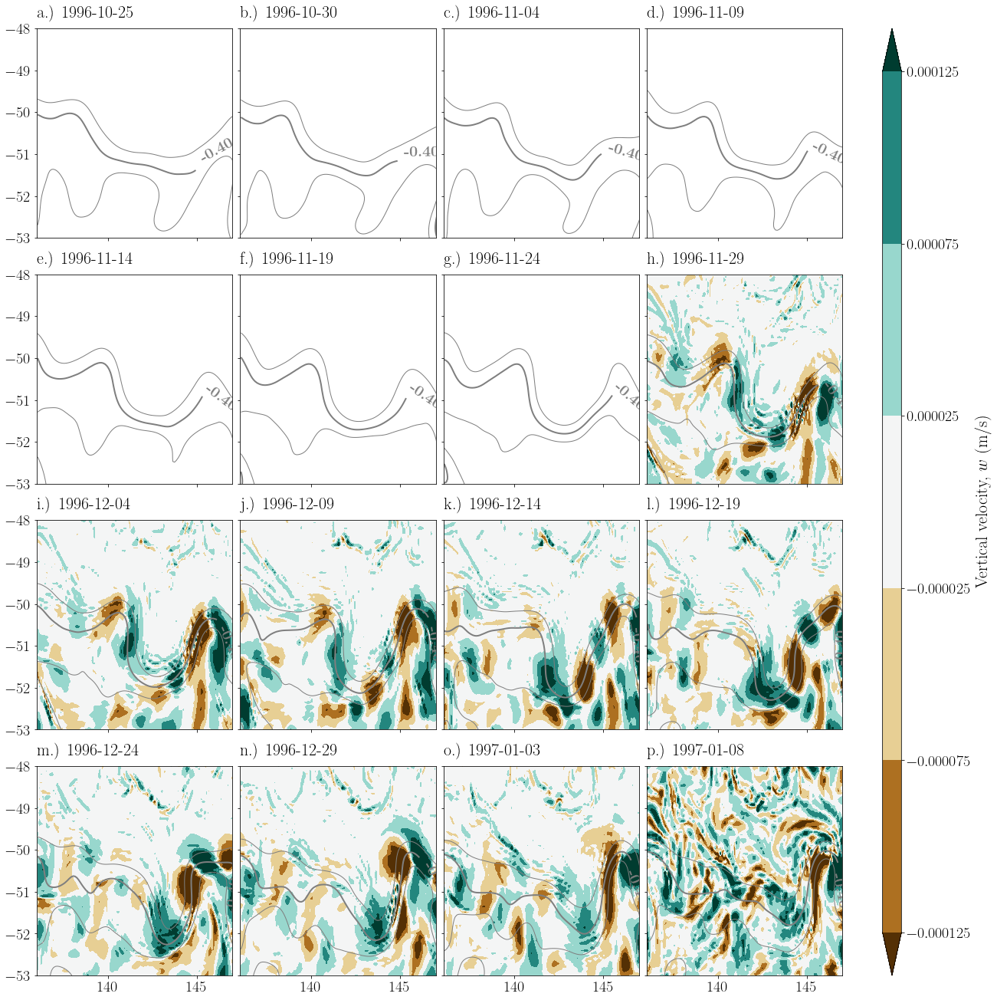

In [19]:
nsubs = len(vel_resample.time)
ncols = 4
nrows = nsubs // ncols + 1 if nsubs % ncols > 0 else nsubs // ncols
print(nsubs, ncols, nrows)

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18,4.5*nrows), sharex=True, sharey=True, constrained_layout=True)

for i, t in enumerate(vel_resample.time):

    r, c = i // ncols, i % ncols

    # vertical velocity
    pcol = vel_resample.wt.isel(sw_ocean=30).sel(time=t).plot.contourf(
        ax=ax[r, c], levels=wt_contours, cmap=plt.cm.BrBG, extend='both', add_colorbar=False)

    # sea level contours
    cont = vel_resample.sea_level.sel(time=t).plot.contour(
        ax=ax[r, c], levels=sl_contours, linestyles='solid', linewidths=1, colors='tab:gray')
    for ib, b in enumerate(sl_contours):
        if b in sl_contours[1:-1:2]:
            zc = cont.collections[ib]
            plt.setp(zc, linewidth=2)
    ax[r,c].clabel(cont, sl_contours[1:-1:2], inline=1, fontsize=fs_small, fmt=r'{\bf %.2f}', manual=[(146.25, -51)])

    t_start = pd.to_datetime(str(t.data)).strftime('%Y-%m-%d')
    ax[r, c].text(0, 1.05, string.ascii_lowercase[i] + '.) %s' %t_start, 
             transform=ax[r, c].transAxes, size=fs_large)
    ax[r, c].set_ylabel('')
    ax[r, c].set_xlabel('')
    ax[r, c].set_title('')
    ax[r, c].set_xlim([136, 147])
    ax[r, c].set_ylim([-53, -48])
    
cbar = fig.colorbar(pcol, ax=ax, aspect=50, extend='both')
cbar.ax.set_ylabel(r'Vertical velocity, $w$ (m/s)')

Text(0, 0.5, 'Vertical velocity at 217.0, $w$ (m/s)')

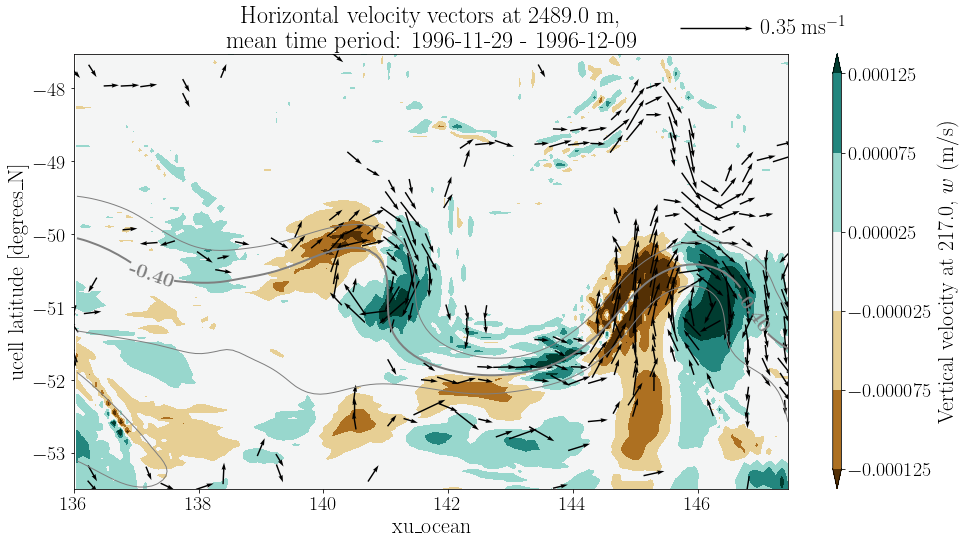

In [20]:
slc = slice(None, None, 3)
scale=0.35
cmap = plt.cm.RdYlBu
vmin, vmax = -1.05, 0.15
bounds = np.linspace(vmin, vmax, 9)

fig, ax = plt.subplots(figsize=(16,8))

# vertical velocity at sub-surface
wt_plot = vel_flex.wt.mean('time').isel(sw_ocean=30)
pcol = wt_plot.plot.contourf(ax=ax, levels=wt_contours, cmap=plt.cm.BrBG, extend='both', add_colorbar=False)

# sea level contours
cont = vel_flex.sea_level.mean('time').plot.contour(
    ax=ax, levels=sl_contours, linestyles='solid', linewidths=1, colors='tab:gray')
for ib, b in enumerate(sl_contours):
    if b in sl_contours[1:-1:2]:
        zc = cont.collections[ib]
        plt.setp(zc, linewidth=2)
ax.clabel(cont, sl_contours[1:-1:2], inline=1, fontsize=fs_small, fmt=r'{\bf %.2f}', manual=[(137, -51.25), (146.25, -51.5)])

# horizontal velocities at 2500dbar
vel_t = vel_flex.mean('time').sel(st_ocean=d_int, method='nearest')
quiv = vel_t.where(vel_t.V >= V_threshold).sel(xu_ocean=slc, yu_ocean=slc).plot.quiver(
    ax=ax, x='xu_ocean', y='yu_ocean', u='u', v='v', color='k',
    units='inches', scale=scale, width=1.25e-3*fig.get_size_inches()[0], add_guide=False)
qk = plt.quiverkey(quiv, 0.95, 1.06, scale, r'$%s\:\mathrm{ms}^{-1}$' %scale, labelpos='E', color='k',
               fontproperties={'size': fs_large}, transform=ax.transAxes)

ax.set_xlim([136, None])
# ax.set_ylim([-53, -48])
# ax.set_title()

ax.set_title('Horizontal velocity vectors at %s m, \n mean time period: %s - %s' %(np.round(vel_t.st_ocean.data,0), time_lim[meander]['flex_period'].start, time_lim[meander]['flex_period'].stop))

cbar = fig.colorbar(pcol, ax=ax, aspect=50, extend='both')
cbar.ax.set_ylabel('Vertical velocity at %s, $w$ (m/s)' %np.round(wt_plot.sw_ocean.data,0))

## Movie of sea level contours

In [ ]:
# mask = np.array([True if t.values in sl.sel(time=time_lim).time.values else False for t in sl.time])
bounds = np.linspace(-1, 0.2, 13)

anim = play2d(sl_lim.xt_ocean, sl_lim.yt_ocean, z=sl_lim.values, time=sl_lim.time.values, cmap=plt.cm.RdYlBu_r)
display_animation(anim)

In [8]:
mask = np.array([True if t.values in sl.sel(time=time_lim).time.values else False for t in sl.time])
bounds = np.linspace(-1, 0.2, 13)

anim = play2D(sl_lim.xt_ocean, sl_lim.yt_ocean, z=sl_lim.values, time=sl_lim.time.values, 
              bounds=bounds, type='contour', mask=mask, cmap=plt.cm.RdYlBu_r)
display_animation(anim)